State Names:
Gujarat                  Chhattisgarh             Himachal Pradesh         
Andhra Pradesh           Jammu & Kashmir          Karnataka                
Madhya Pradesh           Maharashtra              Kerala                   
Jharkhand                Tamil Nadu               Odisha                   
Rajasthan                Nagaland                 Telangana                
Tripura                  Uttar Pradesh            West Bengal              
Uttarakhand              
Enter the state name (or type 'All' for all states): All

Reservoir Names in India:
Bhadar Reservoir         Brahmani-I               
Damanganga Reservoir     Dantiwada Reservoir      
Dudhawa                  Gobind Sagar-Bhakra
Reservoir
Hathmati                 Karjan Reservoir         
Kol Dam                  Machhu I                 
Machhu II                Ravishankar Sagar        
Hasdeo Reservoir         Panam Reservoir          
Pong Reservoir           Sabarmati Reservoir      
Sardar Sa

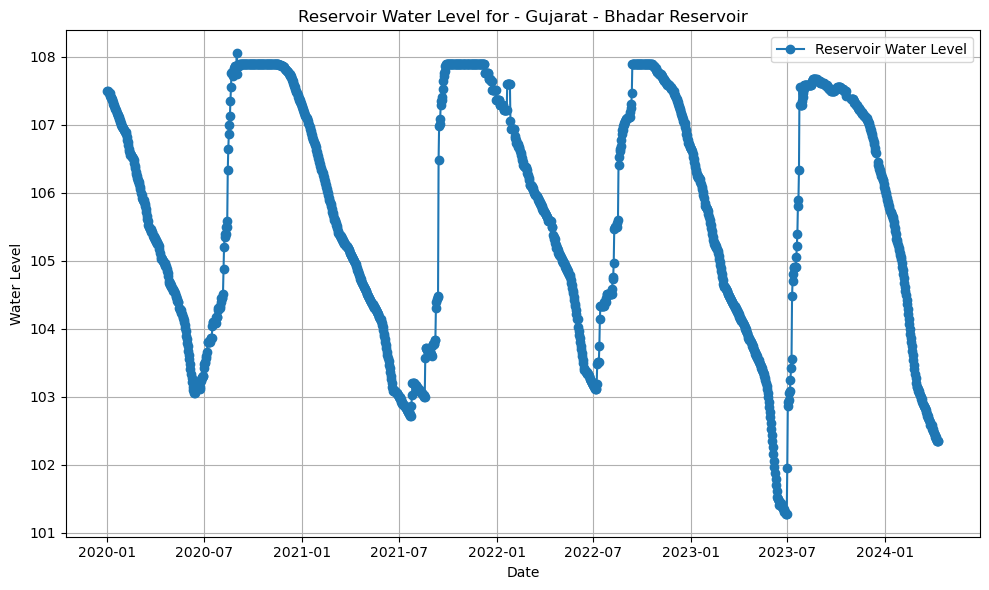

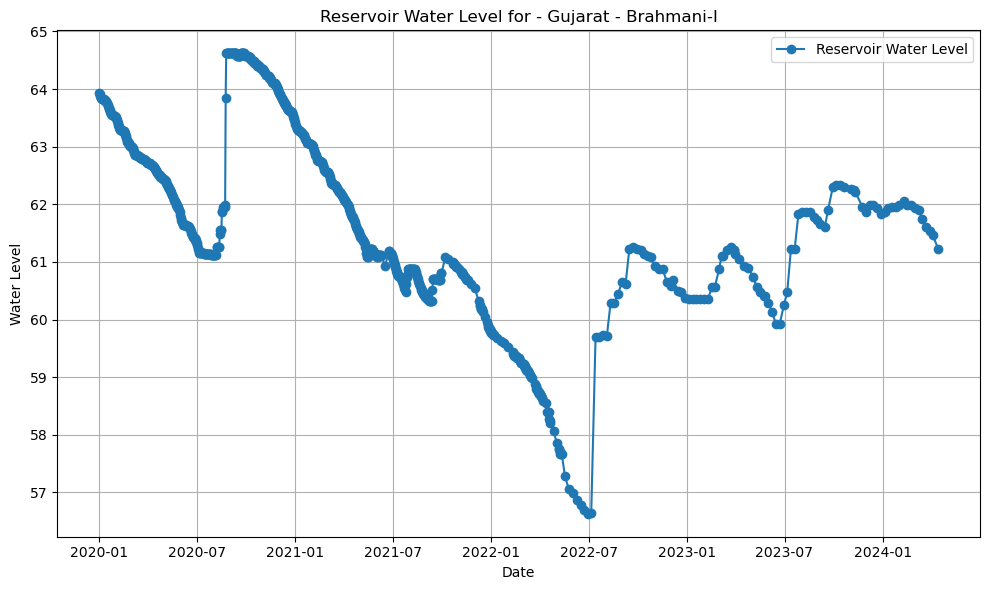

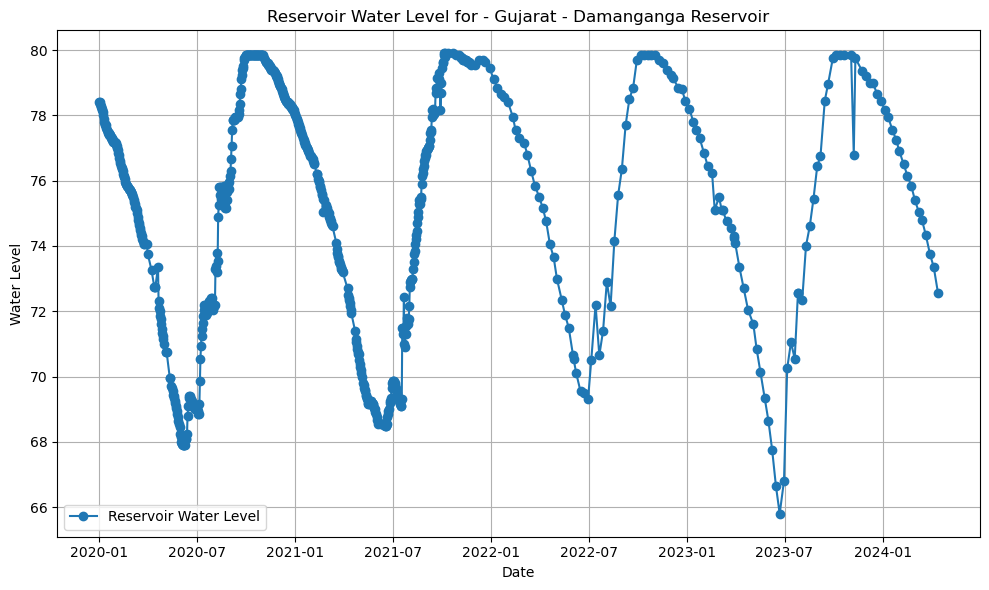

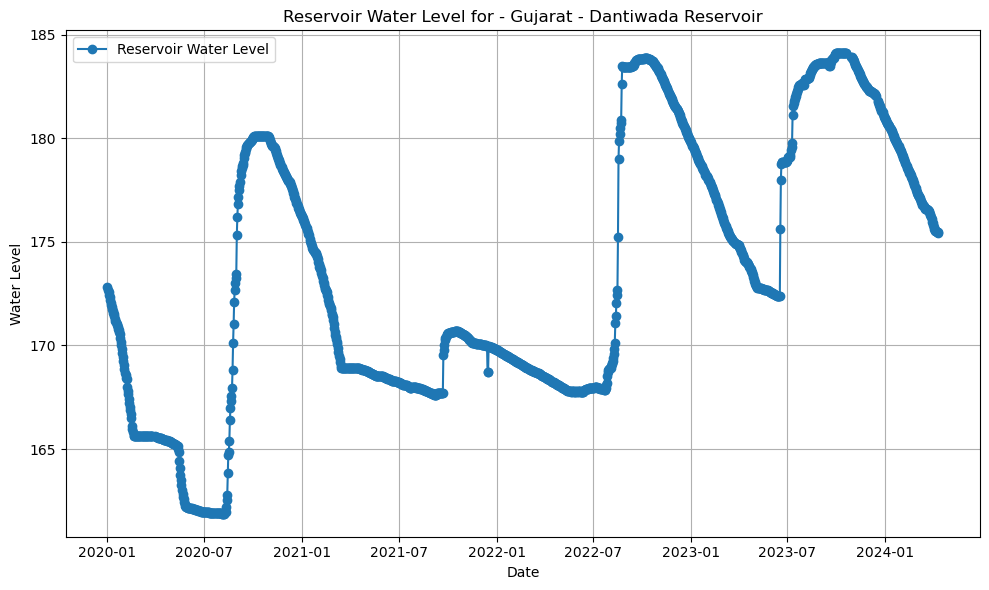

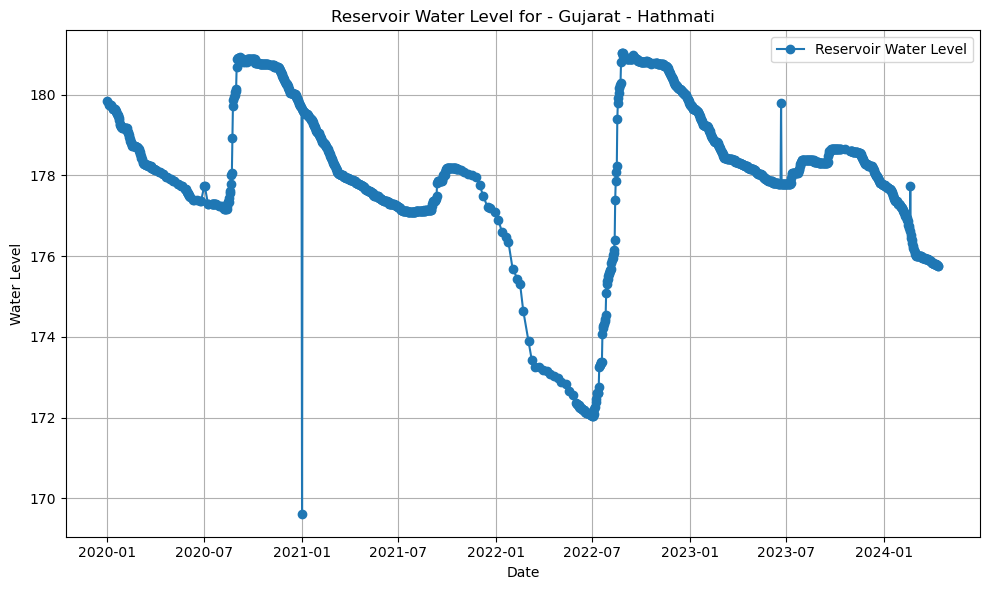

...

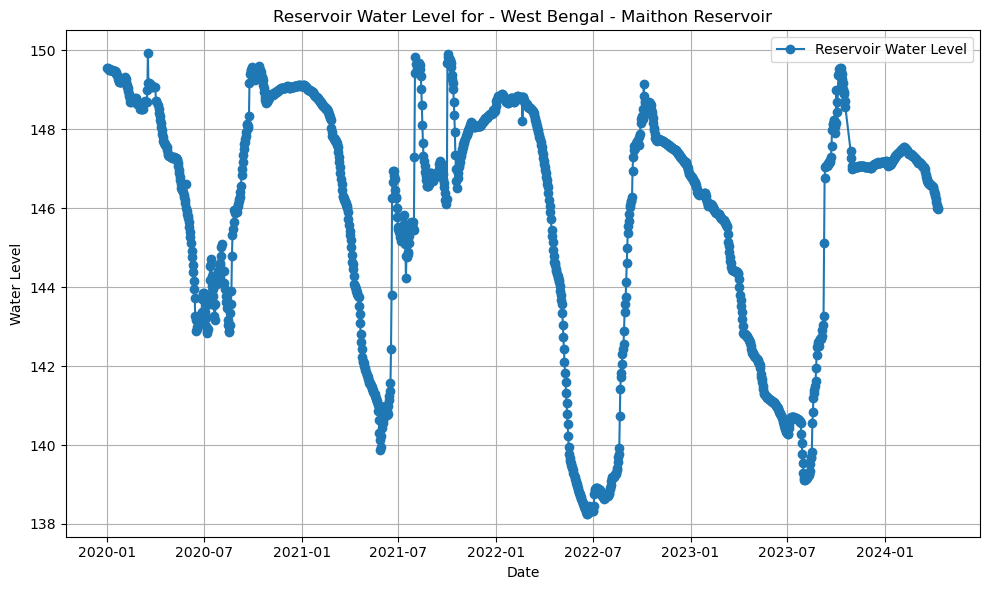

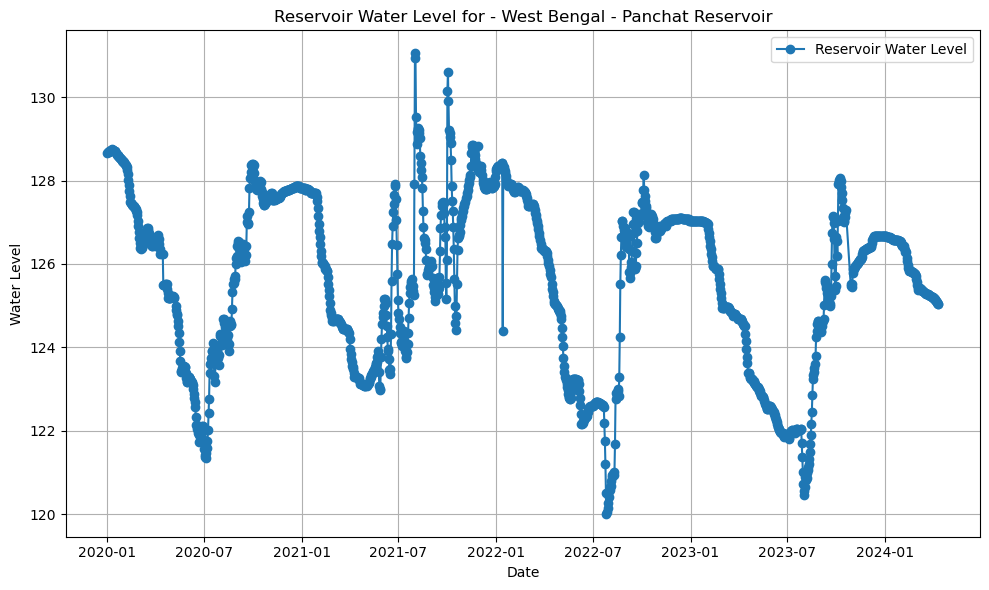

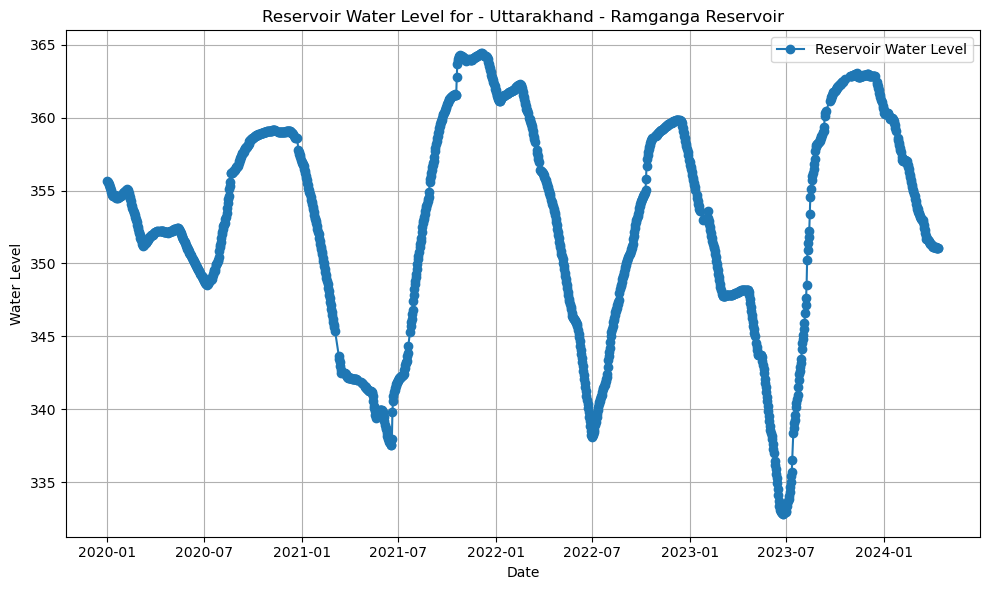

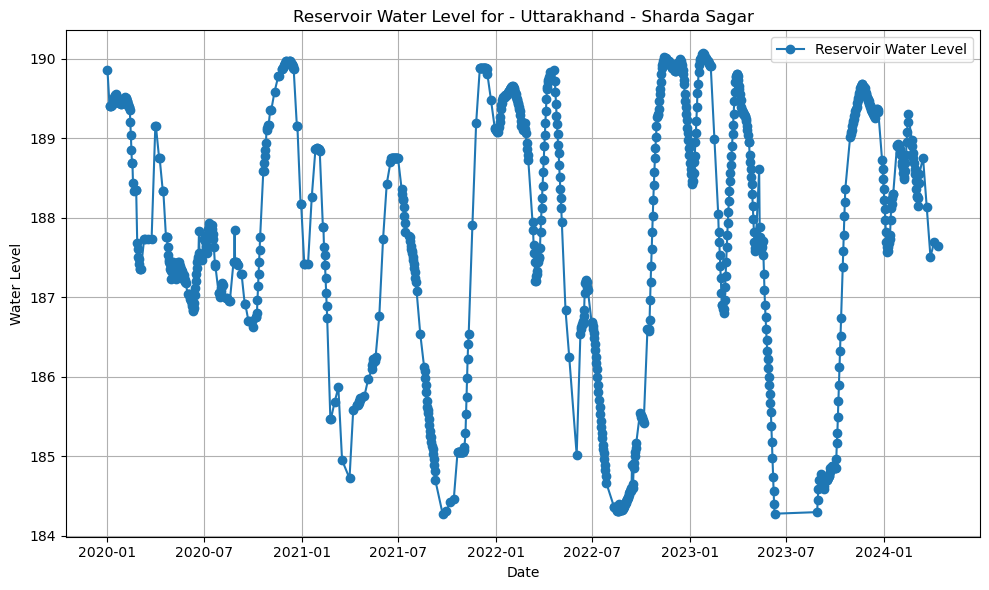

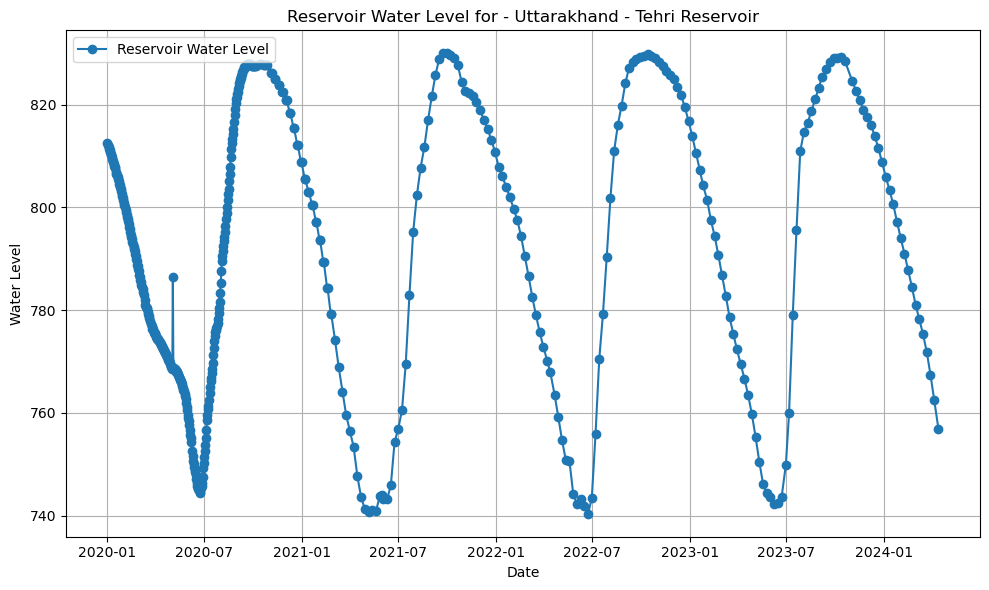

All plots are displayed


In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import textwrap

# Step 1: Load the CSV
data = pd.read_csv(r"C:\\Users\\Trainee1\\Desktop\\Reservoir_CWC\\19.04.2024\\CWC_Reservoir_data.csv")

# Display all state names
unique_states = data['State'].unique()
print("State Names:")
state_column_width = 25
for i in range(0, len(unique_states), 3):
    states_chunk = unique_states[i:i+3]
    for state in states_chunk:
        print(textwrap.fill(state, state_column_width), end=' '*(state_column_width-len(state)))
    print()

# Prompt the user to input state_name
state_name = input("Enter the state name (or type 'All' for all states): ")

# Step 2: Filter data for specific state(s) or all states
if state_name == "All":
    unique_reservoirs = data['Reservoir Name'].unique()  # Get all unique reservoir names
    print("\nReservoir Names in India:")
    reservoir_column_width = 25
    for i in range(0, len(unique_reservoirs), 2):
        reservoirs_chunk = unique_reservoirs[i:i+2]
        for reservoir in reservoirs_chunk:
            print(textwrap.fill(reservoir, reservoir_column_width), end=' '*(reservoir_column_width-len(reservoir)))
        print()
    # Prompt the user to input reservoir_name
    reservoir_name = input("Enter the reservoir name (or type 'All' for all reservoirs): ")
else:
    unique_states = [state_name]
    # Display all unique reservoir names of the selected state
    for state in unique_states:
        data_for_state = data[data['State'] == state]
        unique_reservoirs_state = data_for_state['Reservoir Name'].unique()
        print(f"\nReservoir Names in {state}:")
        reservoir_column_width = 25
        for i in range(0, len(unique_reservoirs_state), 2):
            reservoirs_chunk = unique_reservoirs_state[i:i+2]
            for reservoir in reservoirs_chunk:
                print(textwrap.fill(reservoir, reservoir_column_width), end=' '*(reservoir_column_width-len(reservoir)))
            print()
    # Prompt the user to input reservoir_name if state_name is a specific state
    reservoir_name = input(f"Enter the reservoir name in {state_name} (or type 'All' for all reservoirs in {state_name}): ")

# Filter by years
start_year = int(input("Enter the start year: "))
end_year = int(input("Enter the end year: "))

# Create the output folder if it doesn't exist
output_folder = r"C:\\Users\\Trainee1\\Desktop\\Reservoir_CWC\\CWC_Final\\Plots"
os.makedirs(output_folder, exist_ok=True)

plots_downloaded = False  # Flag to track if any plots were downloaded

for state in unique_states:
    data_for_state = data[data['State'] == state]

    # Step 3: Filter data for specific reservoir(s) or all reservoirs
    if reservoir_name == "All":
        unique_reservoirs = data_for_state['Reservoir Name'].unique()
    else:
        unique_reservoirs = [reservoir_name]

    for reservoir in unique_reservoirs:
        data_for_reservoir = data_for_state[data_for_state['Reservoir Name'] == reservoir]

        # Remove outliers using the IQR method (Inter Quartile Method)
        Q1 = data_for_reservoir['Level'].quantile(0.25)
        Q3 = data_for_reservoir['Level'].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        data_for_reservoir = data_for_reservoir[(data_for_reservoir['Level'] >= lower_bound) & (data_for_reservoir['Level'] <= upper_bound)]

        # Filter data based on start and end years
        data_for_reservoir['Date'] = pd.to_datetime(data_for_reservoir['Date'])
        data_for_reservoir = data_for_reservoir[data_for_reservoir['Date'].dt.year.between(start_year, end_year)]

        # Check if data is available for plotting
        if data_for_reservoir.empty:
            print(f"No data available for {reservoir} in {state} for the selected time period.")
            continue

        dates = pd.to_datetime(data_for_reservoir['Date'])
        level = data_for_reservoir['Level'].dropna()

        plt.figure(figsize=(10, 6))
        plt.plot(dates[:len(level)], level, marker='o', linestyle='-', label="Reservoir Water Level")
        if state_name == "All":
            if not data_for_reservoir.empty:
                state_name_from_data = data_for_reservoir['State'].iloc[0]  # Fetch the state name from data
                plt.title(f"Reservoir Water Level for - {state_name_from_data} - {reservoir}")
            else:
                plt.title(f"Reservoir Water Level for - Unknown State - {reservoir}")
        elif reservoir_name == "All":
            reservoir_name_from_data = data_for_reservoir['Reservoir Name'].iloc[0]  # Fetch the reservoir name from data
            plt.title(f"Reservoir Water Level in {state} - {reservoir_name_from_data}")
        else:
            plt.title(f"Reservoir Water Level in {state} - {reservoir} ")
        plt.xlabel("Date")
        plt.ylabel("Water Level")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
       
        # Save the plot in the output folder with a unique filename
        state_name_formatted = state.replace(" ", "_")  # Replace spaces with underscores
        reservoir_name_formatted = reservoir.replace(" ", "_")  # Replace spaces with underscores
        filename = f"CWC_{state_name_formatted}_{reservoir_name_formatted}_{start_year}_{end_year}.png"
        txt_filename = f"CWC_{state_name_formatted}_{reservoir_name_formatted}_{start_year}_{end_year}.txt"
        filepath = os.path.join(output_folder, filename)
        txt_filepath = os.path.join(output_folder, txt_filename)
#         # Prompt user whether to download the plot
#         download = input("Do you want to download the plot? (Yes/No): ")
#         if download.lower() == 'yes':
        plt.savefig(filepath)
#            plots_downloaded = True  
            # Save the data as txt
        data_for_reservoir.to_csv(txt_filepath, sep='\t', index=False)
        plt.show()

if plots_downloaded:
    print("All plots saved")
else:
    print("All plots are displayed")